In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

np.set_printoptions(precision=4)
sns.set(font_scale=1.5)
plt.style.use('fivethirtyeight')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Loading .csv files:

In [3]:
import glob
csv_files = glob.glob('Beijing/*.csv')
csv_files

['Beijing/PRSA_Data_Gucheng_20130301-20170228.csv',
 'Beijing/PRSA_Data_Huairou_20130301-20170228.csv',
 'Beijing/PRSA_Data_Tiantan_20130301-20170228.csv',
 'Beijing/PRSA_Data_Changping_20130301-20170228.csv',
 'Beijing/PRSA_Data_Guanyuan_20130301-20170228.csv',
 'Beijing/PRSA_Data_Nongzhanguan_20130301-20170228.csv',
 'Beijing/PRSA_Data_Wanliu_20130301-20170228.csv',
 'Beijing/PRSA_Data_Dongsi_20130301-20170228.csv',
 'Beijing/PRSA_Data_Wanshouxigong_20130301-20170228.csv',
 'Beijing/PRSA_Data_Aotizhongxin_20130301-20170228.csv',
 'Beijing/PRSA_Data_Dingling_20130301-20170228.csv',
 'Beijing/PRSA_Data_Shunyi_20130301-20170228.csv']

# Creating a dataset from separate files:

In [4]:
# reading and concating forest condition data
# for files in glob.glob()

df = pd.concat([pd.read_csv(f) for f in csv_files], ignore_index = True)
df

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,6.0,18.0,5.0,NaN,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng
1,2,2013,3,1,1,6.0,15.0,5.0,NaN,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng
2,3,2013,3,1,2,5.0,18.0,NaN,NaN,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng
3,4,2013,3,1,3,6.0,20.0,6.0,NaN,NaN,NaN,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng
4,5,2013,3,1,4,5.0,17.0,5.0,NaN,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420763,35060,2017,2,28,19,27.0,72.0,8.0,92.0,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi
420764,35061,2017,2,28,20,47.0,55.0,17.0,86.0,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi
420765,35062,2017,2,28,21,18.0,28.0,4.0,30.0,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi
420766,35063,2017,2,28,22,18.0,20.0,9.0,33.0,500.0,59.0,7.1,1015.2,-13.2,0.0,WNW,1.8,Shunyi


# Looking for NaN values

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 18 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   No       420768 non-null  int64  
 1   year     420768 non-null  int64  
 2   month    420768 non-null  int64  
 3   day      420768 non-null  int64  
 4   hour     420768 non-null  int64  
 5   PM2.5    412029 non-null  float64
 6   PM10     414319 non-null  float64
 7   SO2      411747 non-null  float64
 8   NO2      408652 non-null  float64
 9   CO       400067 non-null  float64
 10  O3       407491 non-null  float64
 11  TEMP     420370 non-null  float64
 12  PRES     420375 non-null  float64
 13  DEWP     420365 non-null  float64
 14  RAIN     420378 non-null  float64
 15  wd       418946 non-null  object 
 16  WSPM     420450 non-null  float64
 17  station  420768 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 57.8+ MB


In [6]:
df.isna().sum()

No             0
year           0
month          0
day            0
hour           0
PM2.5       8739
PM10        6449
SO2         9021
NO2        12116
CO         20701
O3         13277
TEMP         398
PRES         393
DEWP         403
RAIN         390
wd          1822
WSPM         318
station        0
dtype: int64

# Getting statistical info:

In [7]:
df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,412029.000000,414319.000000,411747.000000,408652.000000,400067.000000,407491.000000,420370.000000,420375.000000,420365.000000,420378.000000,420450.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,79.793428,104.602618,15.830835,50.638586,1230.766454,57.372271,13.538976,1010.746982,2.490822,0.064476,1.729711
std,10122.116943,1.177198,3.448707,8.800102,6.922195,80.822391,91.772426,21.650603,35.127912,1160.182716,56.661607,11.436139,10.474055,13.793847,0.821004,1.246386
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.400000,-43.400000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,20.000000,36.000000,3.000000,23.000000,500.000000,11.000000,3.100000,1002.300000,-8.900000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,55.000000,82.000000,7.000000,43.000000,900.000000,45.000000,14.500000,1010.400000,3.100000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,111.000000,145.000000,20.000000,71.000000,1500.000000,82.000000,23.300000,1019.000000,15.100000,0.000000,2.200000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,999.000000,999.000000,500.000000,290.000000,10000.000000,1071.000000,41.600000,1042.800000,29.100000,72.500000,13.200000


# Filling the NaN values with the median value of column. Dropping the number ['No'] column...

In [8]:
df['PM2.5'].fillna(df['PM2.5'].median(), inplace=True)
df['PM10'].fillna(df['PM10'].median(), inplace=True)
df['SO2'].fillna(df['SO2'].median(), inplace=True)
df['NO2'].fillna(df['NO2'].mean(), inplace=True)
df['CO'].fillna(df['CO'].median(), inplace=True)
df['O3'].fillna(df['O3'].median(), inplace=True)
df['TEMP'].fillna(df['TEMP'].median(), inplace=True)
df['PRES'].fillna(df['PRES'].median(), inplace=True)
df['DEWP'].fillna(df['DEWP'].median(), inplace=True)
df['RAIN'].fillna(df['RAIN'].median(), inplace=True)
df['WSPM'].fillna(df['WSPM'].median(), inplace=True)
df.dropna(subset = ['wd'], inplace=True)
df.drop(['No'], axis = 1, inplace = True)
df.shape

(418946, 17)

# Checking if all the stations are presented equally (almost...)

In [9]:
df.station.value_counts()

station
Tiantan          34986
Nongzhanguan     34986
Dongsi           34986
Wanshouxigong    34985
Guanyuan         34983
Aotizhongxin     34983
Wanliu           34941
Changping        34924
Dingling         34924
Gucheng          34905
Huairou          34762
Shunyi           34581
Name: count, dtype: int64

In [10]:
df.columns

Index(['year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2', 'CO',
       'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')

# Checking the result of cleaning

In [11]:
df.isnull().sum()

year       0
month      0
day        0
hour       0
PM2.5      0
PM10       0
SO2        0
NO2        0
CO         0
O3         0
TEMP       0
PRES       0
DEWP       0
RAIN       0
wd         0
WSPM       0
station    0
dtype: int64

# Converting Year, Month, Day and Hour columns into pandas timeseries:

In [13]:
df['dateInt']=df['year'].astype(str) + df['month'].astype(str).str.zfill(2)+ df['day'].astype(str).str.zfill(2)+df['hour'].astype(str).str.zfill(2)
df['Date'] = pd.to_datetime(df['dateInt'], format='%Y%m%d%H')
df['dateInt']=df['year'].astype(str) + df['month'].astype(str).str.zfill(2)+ df['day'].astype(str).str.zfill(2)
df['date'] = pd.to_datetime(df['dateInt'], format='%Y%m%d')

In [14]:
df.set_index('Date', inplace=True)
df.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
Date,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,3,1,0,6.0,18.0,5.0,50.638586,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng,20130301,2013-03-01
2013-03-01 01:00:00,2013,3,1,1,6.0,15.0,5.0,50.638586,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng,20130301,2013-03-01
2013-03-01 02:00:00,2013,3,1,2,5.0,18.0,7.0,50.638586,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng,20130301,2013-03-01
2013-03-01 03:00:00,2013,3,1,3,6.0,20.0,6.0,50.638586,900.0,45.0,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng,20130301,2013-03-01
2013-03-01 04:00:00,2013,3,1,4,5.0,17.0,5.0,50.638586,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng,20130301,2013-03-01


# Checking the columns date type

In [15]:
df.dtypes

year                int64
month               int64
day                 int64
hour                int64
PM2.5             float64
PM10              float64
SO2               float64
NO2               float64
CO                float64
O3                float64
TEMP              float64
PRES              float64
DEWP              float64
RAIN              float64
wd                 object
WSPM              float64
station            object
dateInt            object
date       datetime64[ns]
dtype: object

In [16]:
df

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
Date,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,3,1,0,6.0,18.0,5.0,50.638586,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng,20130301,2013-03-01
2013-03-01 01:00:00,2013,3,1,1,6.0,15.0,5.0,50.638586,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng,20130301,2013-03-01
2013-03-01 02:00:00,2013,3,1,2,5.0,18.0,7.0,50.638586,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng,20130301,2013-03-01
2013-03-01 03:00:00,2013,3,1,3,6.0,20.0,6.0,50.638586,900.0,45.0,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng,20130301,2013-03-01
2013-03-01 04:00:00,2013,3,1,4,5.0,17.0,5.0,50.638586,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng,20130301,2013-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-28 19:00:00,2017,2,28,19,27.0,72.0,8.0,92.000000,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi,20170228,2017-02-28
2017-02-28 20:00:00,2017,2,28,20,47.0,55.0,17.0,86.000000,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi,20170228,2017-02-28
2017-02-28 21:00:00,2017,2,28,21,18.0,28.0,4.0,30.000000,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi,20170228,2017-02-28


In [17]:
# saving clean data to csv

df.to_csv('clean_data.csv', index=True)

In [18]:
df

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
Date,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,3,1,0,6.0,18.0,5.0,50.638586,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng,20130301,2013-03-01
2013-03-01 01:00:00,2013,3,1,1,6.0,15.0,5.0,50.638586,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng,20130301,2013-03-01
2013-03-01 02:00:00,2013,3,1,2,5.0,18.0,7.0,50.638586,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng,20130301,2013-03-01
2013-03-01 03:00:00,2013,3,1,3,6.0,20.0,6.0,50.638586,900.0,45.0,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng,20130301,2013-03-01
2013-03-01 04:00:00,2013,3,1,4,5.0,17.0,5.0,50.638586,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng,20130301,2013-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-28 19:00:00,2017,2,28,19,27.0,72.0,8.0,92.000000,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi,20170228,2017-02-28
2017-02-28 20:00:00,2017,2,28,20,47.0,55.0,17.0,86.000000,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi,20170228,2017-02-28
2017-02-28 21:00:00,2017,2,28,21,18.0,28.0,4.0,30.000000,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi,20170228,2017-02-28


In [19]:
df2 = pd.read_csv('clean_data.csv')
df2

,Date,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
0,2013-03-01 00:00:00,2013,3,1,0,6.0,18.0,5.0,50.638586,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng,20130301,2013-03-01
1,2013-03-01 01:00:00,2013,3,1,1,6.0,15.0,5.0,50.638586,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng,20130301,2013-03-01
2,2013-03-01 02:00:00,2013,3,1,2,5.0,18.0,7.0,50.638586,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng,20130301,2013-03-01
3,2013-03-01 03:00:00,2013,3,1,3,6.0,20.0,6.0,50.638586,900.0,45.0,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng,20130301,2013-03-01
4,2013-03-01 04:00:00,2013,3,1,4,5.0,17.0,5.0,50.638586,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng,20130301,2013-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418941,2017-02-28 19:00:00,2017,2,28,19,27.0,72.0,8.0,92.000000,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi,20170228,2017-02-28
418942,2017-02-28 20:00:00,2017,2,28,20,47.0,55.0,17.0,86.000000,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi,20170228,2017-02-28
418943,2017-02-28 21:00:00,2017,2,28,21,18.0,28.0,4.0,30.000000,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi,20170228,2017-02-28
418944,2017-02-28 22:00:00,2017,2,28,22,18.0,20.0,9.0,33.000000,500.0,59.0,7.1,1015.2,-13.2,0.0,WNW,1.8,Shunyi,20170228,2017-02-28


# Exploratory Data Analysis
## Looking at the outliers of the variables per station, month, day and hour

# PM 2.5 Outliers

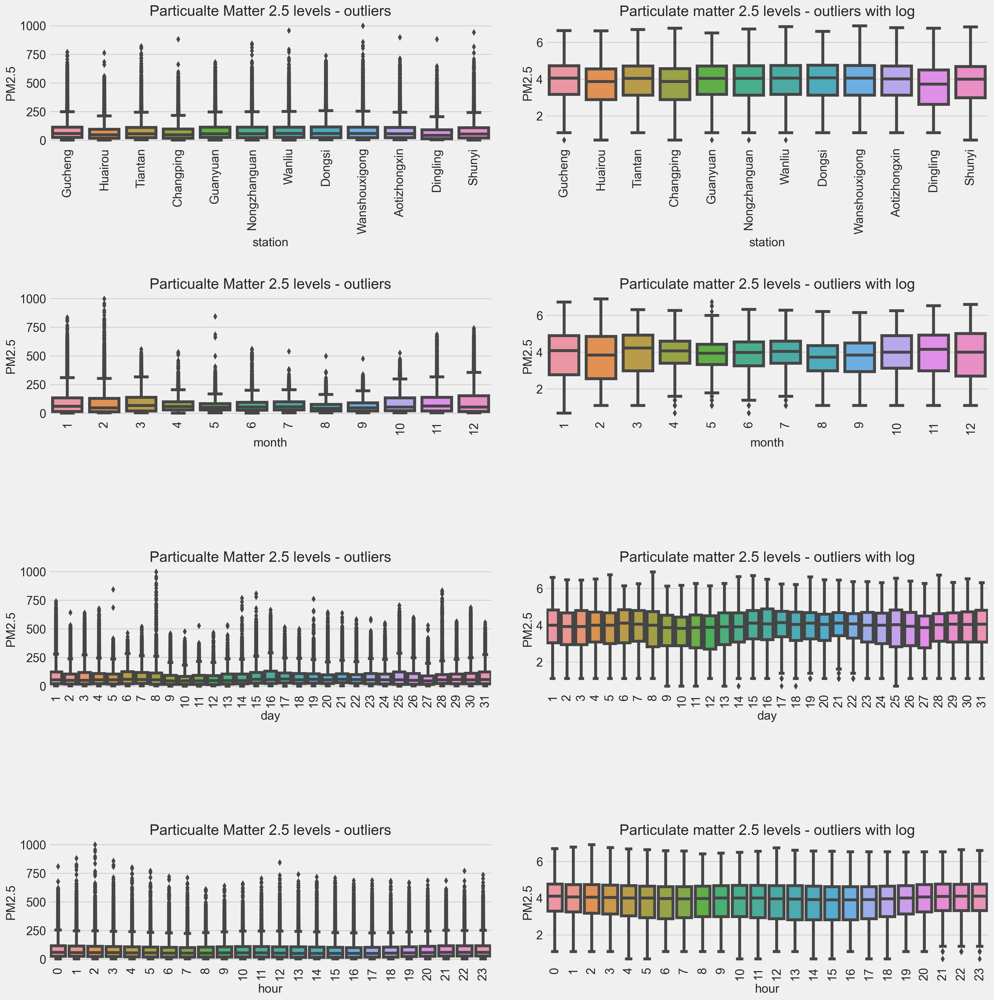

In [20]:
plt.figure(figsize=(20,20))

for number, col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2, number*2+1)
    plt.title('Particualte Matter 2.5 levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(data= df, x=df[col], y=df['PM2.5'])
    plt.subplot(4,2,number*2+2)
    plt.title('Particulate matter 2.5 levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(data = df, x=df[col], y=np.log(df['PM2.5']))



# PM 10 outliers

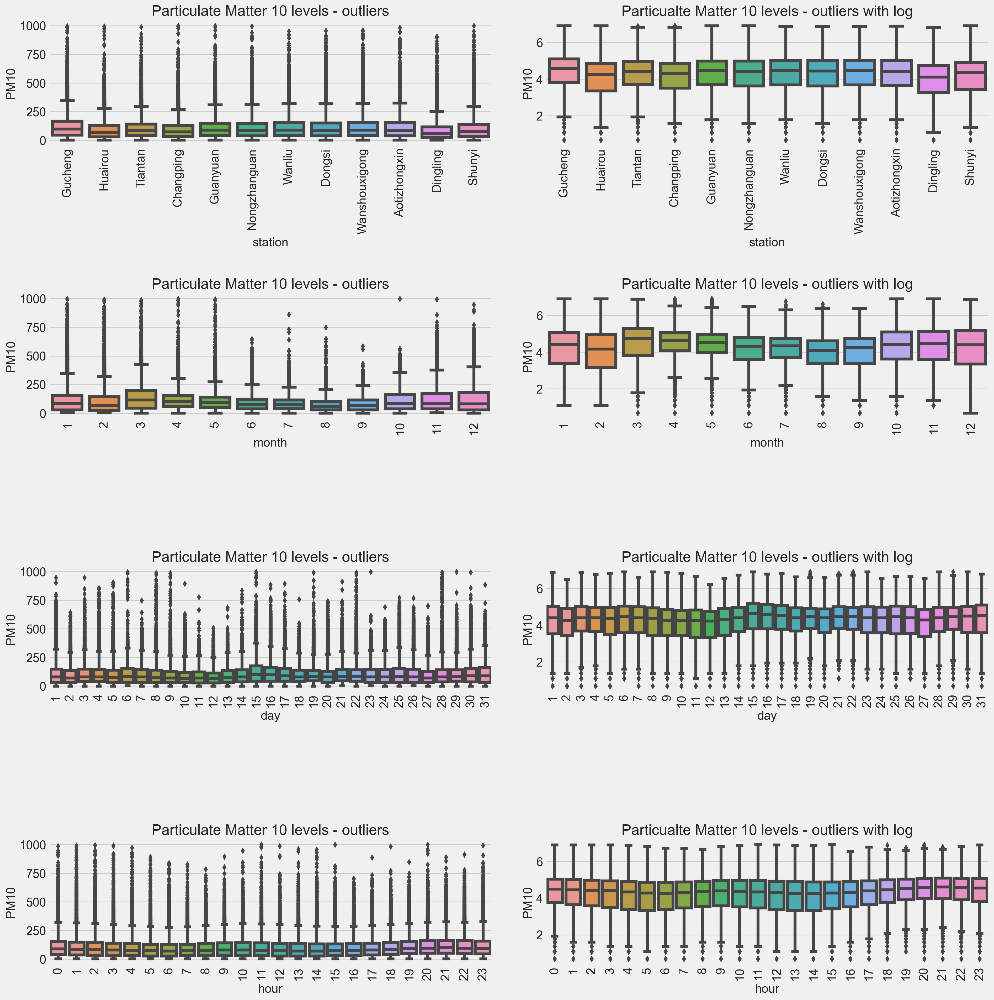

In [21]:
plt.figure(figsize=(20,20))
for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Particulate Matter 10 levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(data = df, x=df[col], y=df['PM10'])
    plt.subplot(4,2,number*2+2)
    plt.title('Particualte Matter 10 levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col],y=np.log(df['PM10']))



# Sulfur dioxide outliers

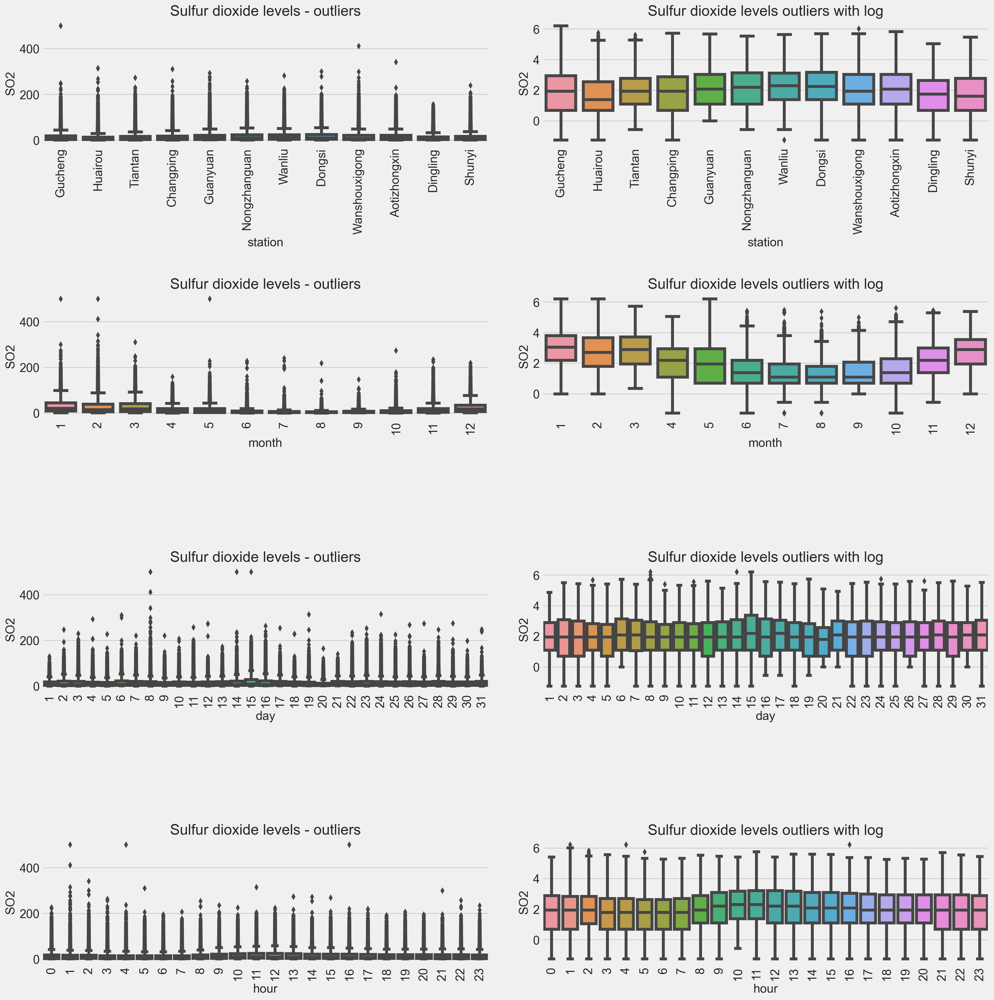

In [22]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Sulfur dioxide levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['SO2'])
    plt.subplot(4,2,number*2+2)
    plt.title('Sulfur dioxide levels outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['SO2']))



# Nitrogen dioxide outliers

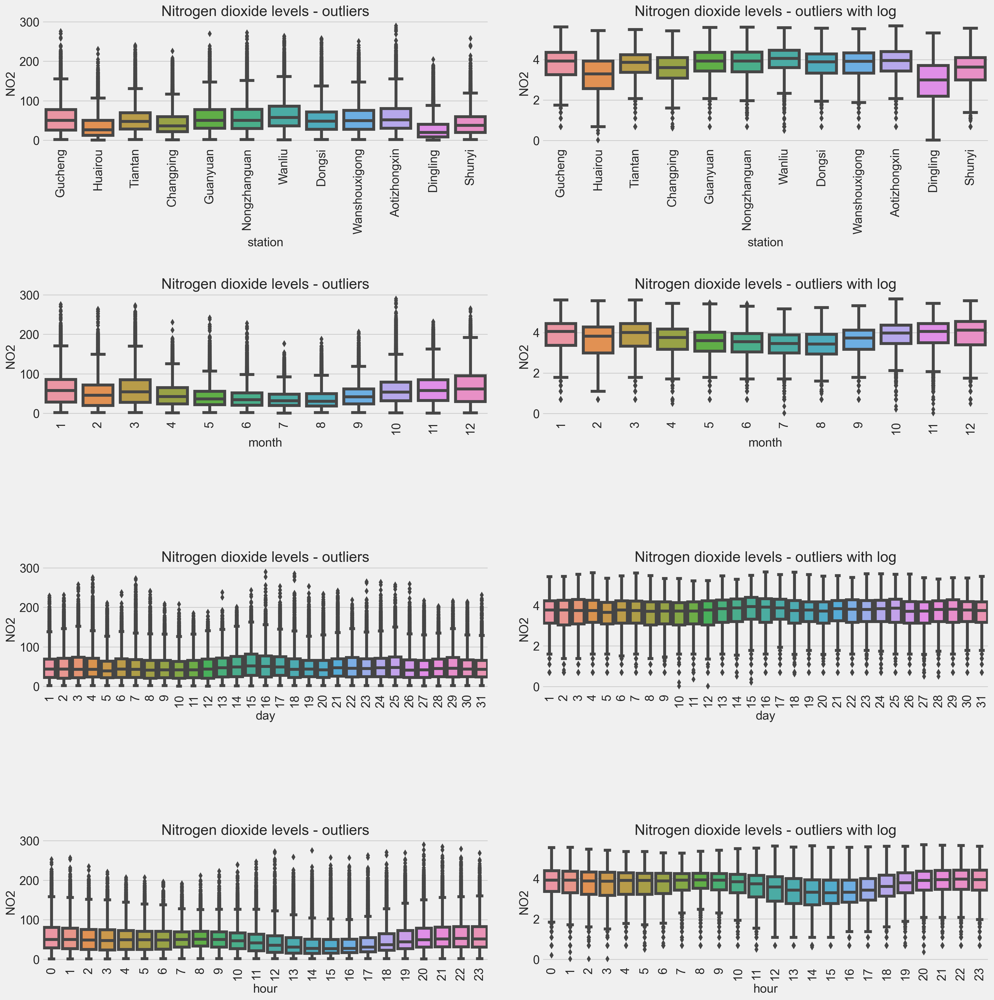

In [23]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Nitrogen dioxide levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['NO2'])
    plt.subplot(4,2,number*2+2)
    plt.title('Nitrogen dioxide levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['NO2']))



# Carbon monoxide outliers

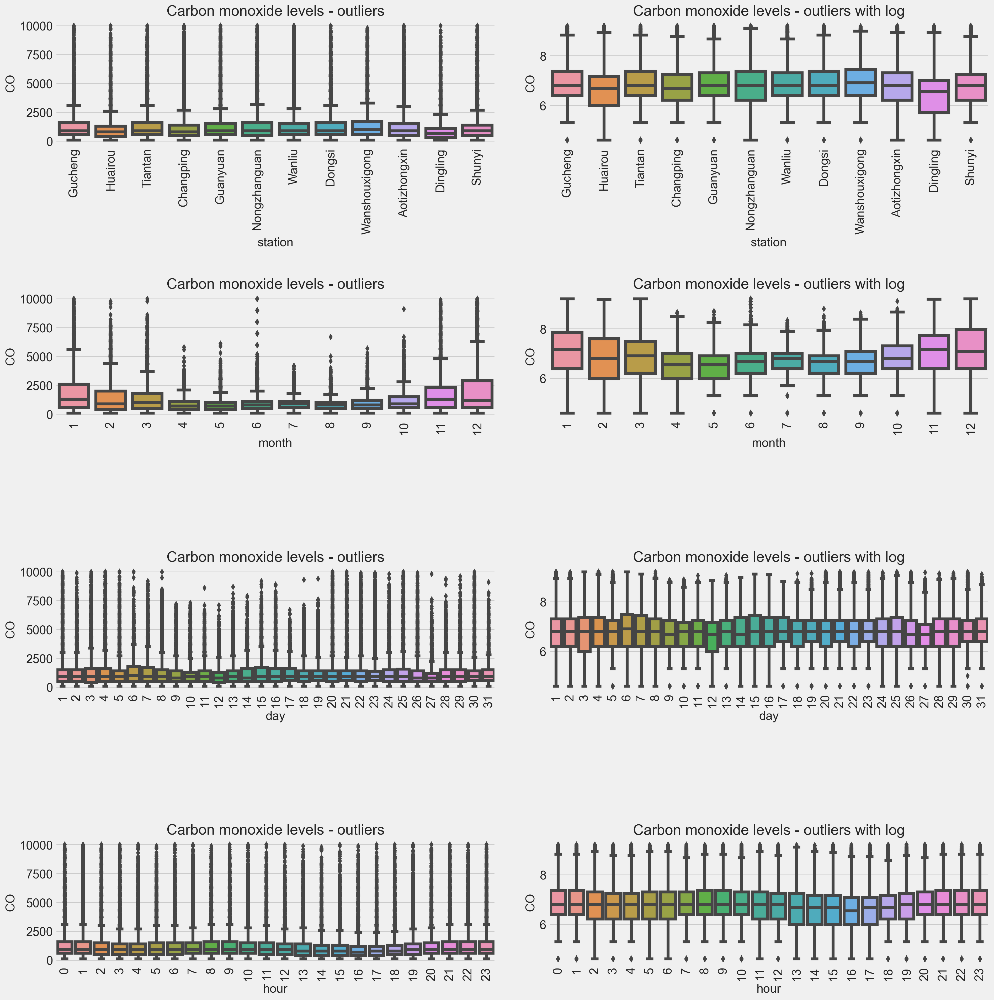

In [24]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Carbon monoxide levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['CO'])
    plt.subplot(4,2,number*2+2)
    plt.title('Carbon monoxide levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['CO']))

# Ozone level outliers

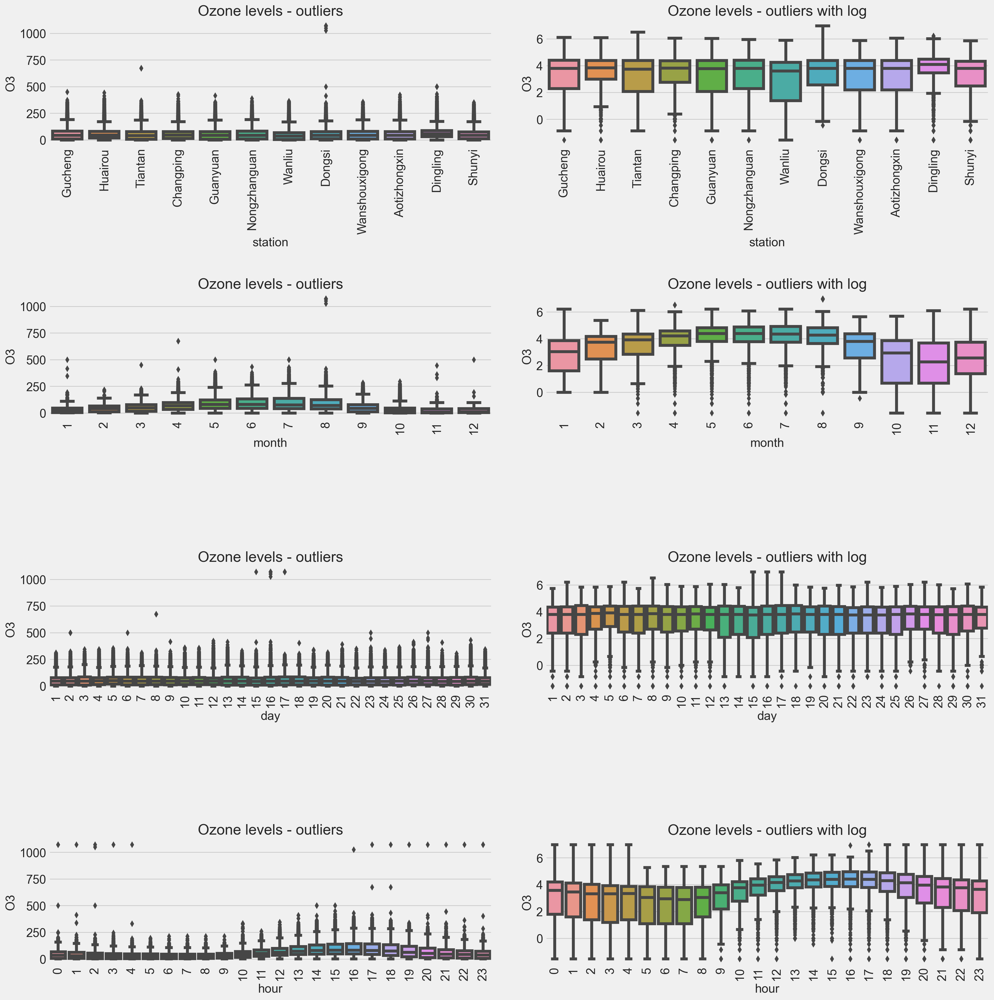

In [25]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Ozone levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['O3'])
    plt.subplot(4,2,number*2+2)
    plt.title('Ozone levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['O3']))

# Temperature level outliers

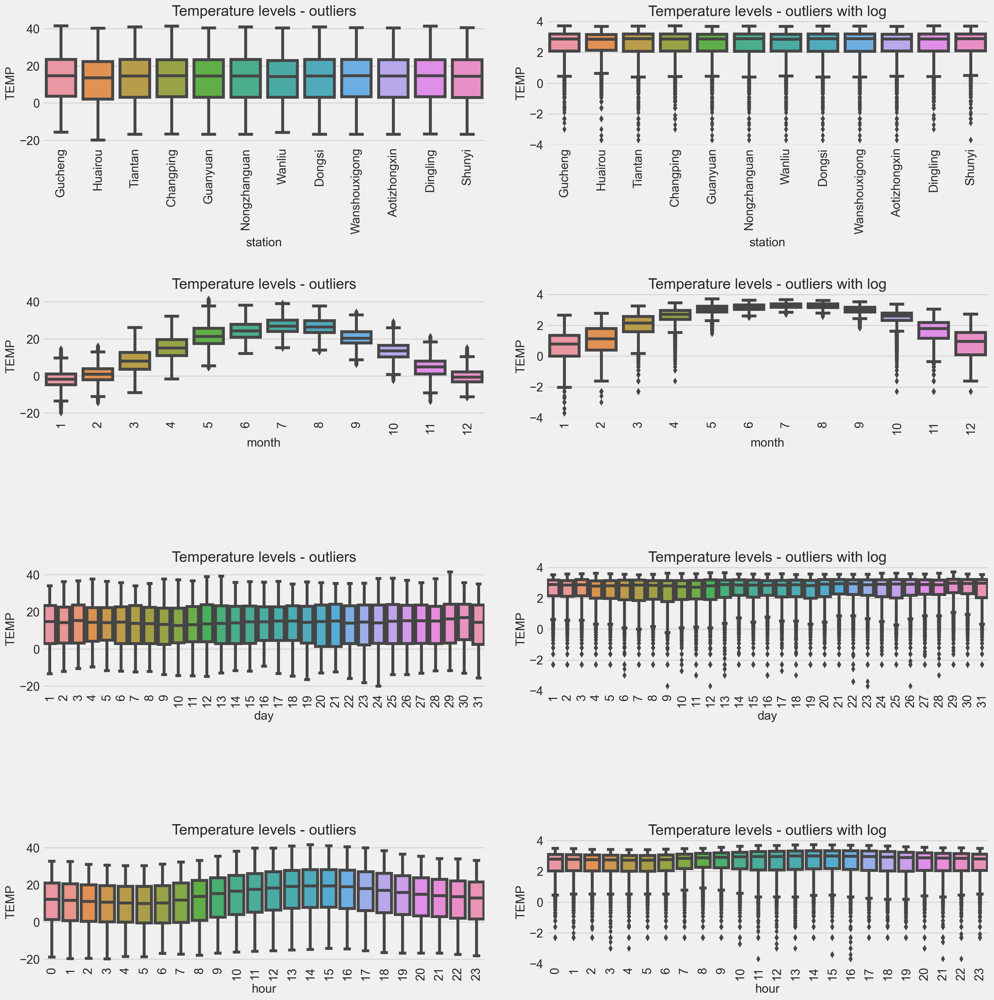

In [26]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Temperature levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['TEMP'])
    plt.subplot(4,2,number*2+2)
    plt.title('Temperature levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['TEMP']))

# Pressure level outliers

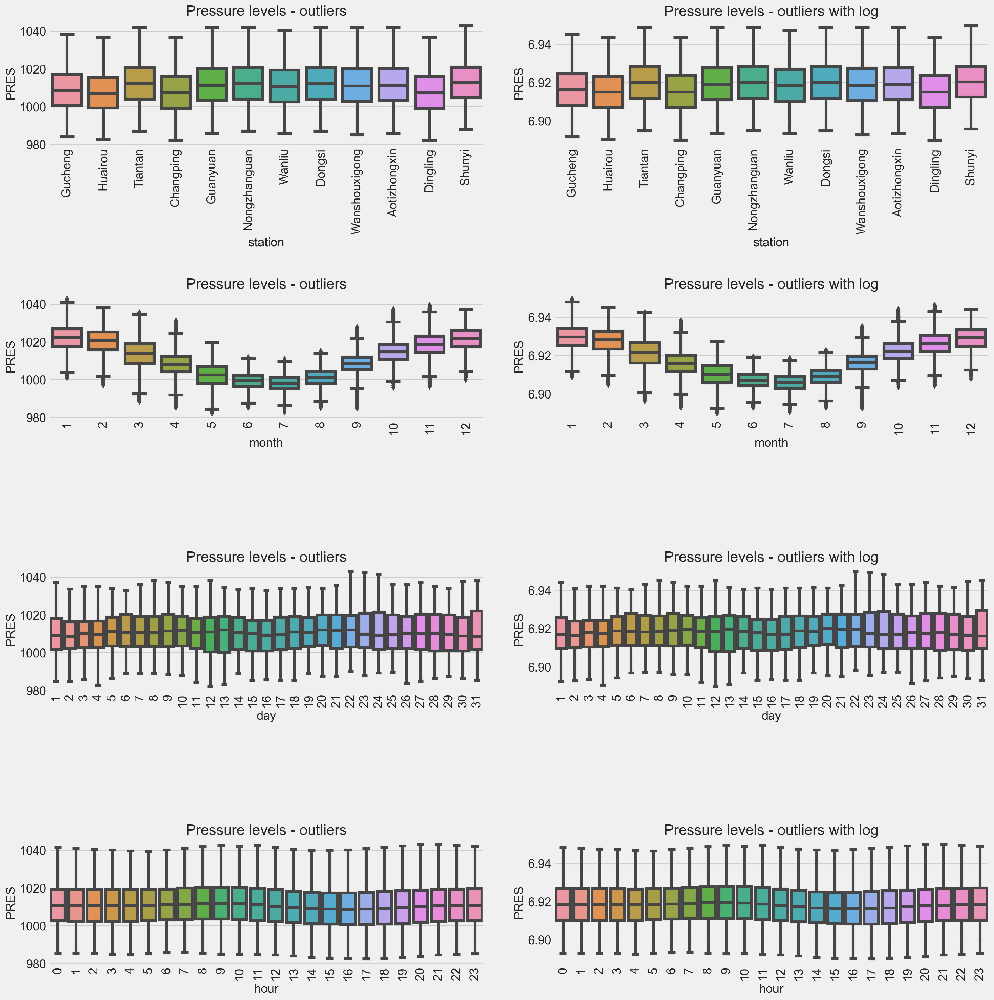

In [27]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Pressure levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['PRES'])
    plt.subplot(4,2,number*2+2)
    plt.title('Pressure levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['PRES']))

# Dew point outliers

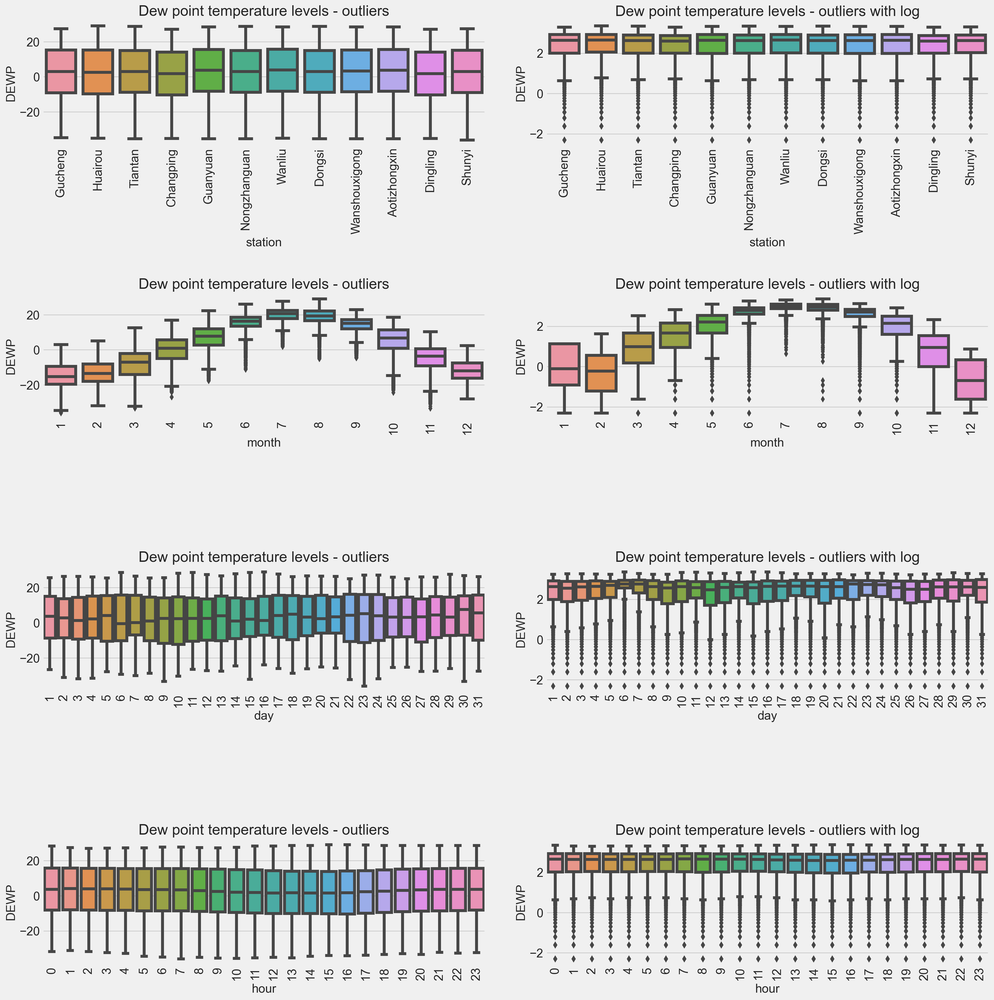

In [28]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Dew point temperature levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['DEWP'])
    plt.subplot(4,2,number*2+2)
    plt.title('Dew point temperature levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['DEWP']))

# Rain level outliers

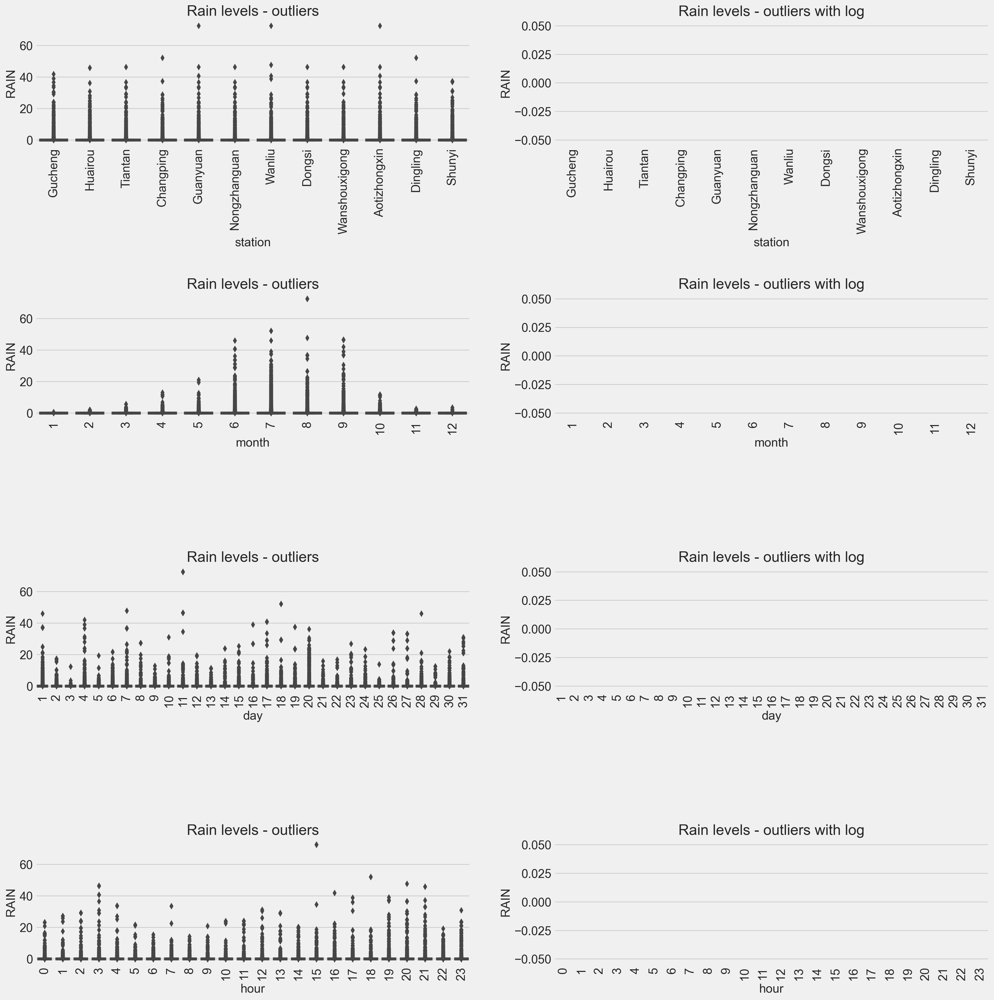

In [29]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Rain levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['RAIN'])
    plt.subplot(4,2,number*2+2)
    plt.title('Rain levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['RAIN']))

# Wind speed outliers

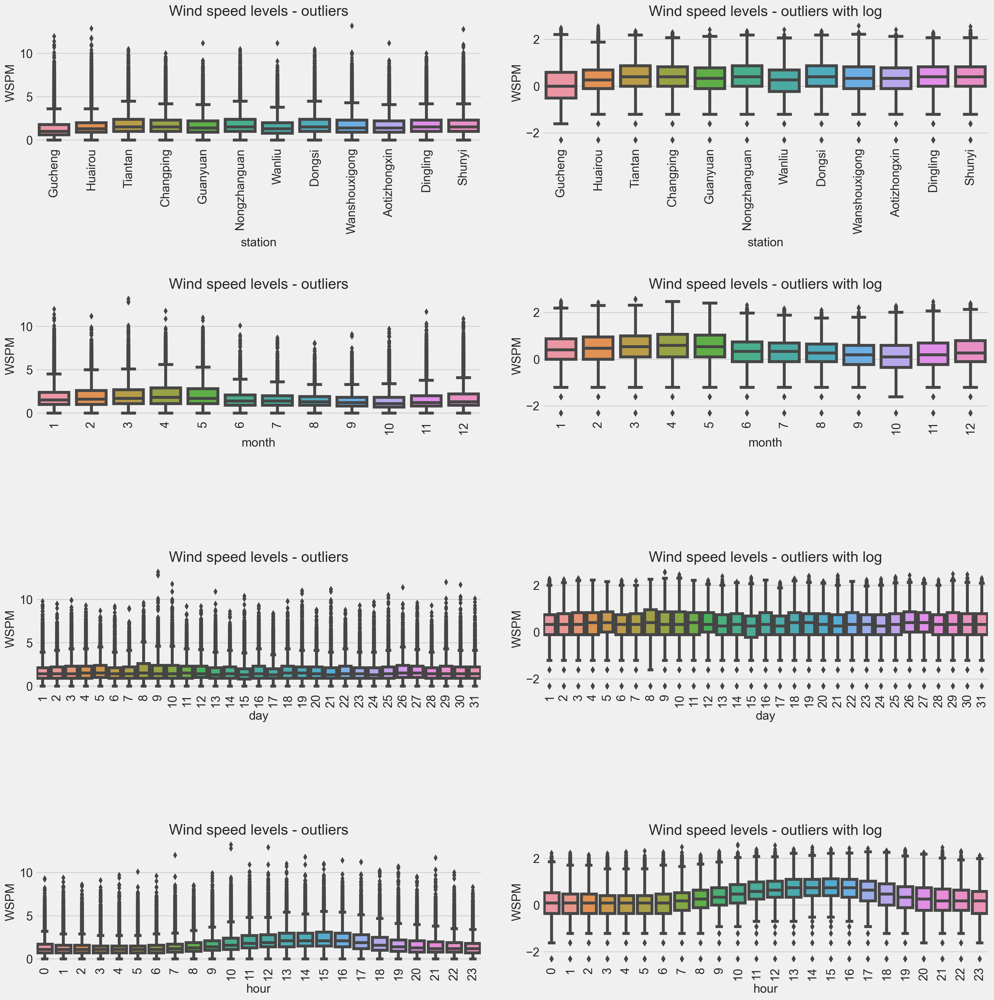

In [30]:
plt.figure(figsize=(20,20))

for number,col in enumerate(['station','month','day','hour']):
    plt.subplot(4,2,number*2+1)
    plt.title('Wind speed levels - outliers')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=df['WSPM'])
    plt.subplot(4,2,number*2+2)
    plt.title('Wind speed levels - outliers with log')
    plt.xticks(rotation='vertical')
    plt.tight_layout(pad=3.0)
    sns.boxplot(x=df[col], y=np.log(df['WSPM']))

# Dropping separate date columns

In [31]:
df.head(5)

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
Date,,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,2013,3,1,0,6.0,18.0,5.0,50.638586,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng,20130301,2013-03-01
2013-03-01 01:00:00,2013,3,1,1,6.0,15.0,5.0,50.638586,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng,20130301,2013-03-01
2013-03-01 02:00:00,2013,3,1,2,5.0,18.0,7.0,50.638586,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng,20130301,2013-03-01
2013-03-01 03:00:00,2013,3,1,3,6.0,20.0,6.0,50.638586,900.0,45.0,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng,20130301,2013-03-01
2013-03-01 04:00:00,2013,3,1,4,5.0,17.0,5.0,50.638586,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng,20130301,2013-03-01


In [33]:
cols_to_drop = ['year', 'month', 'day', 'hour', 'wd', 'station', 'dateInt', 'date']
df = df.drop(cols_to_drop, axis = 1)

In [34]:
df_daily = df.resample('D').mean()
df_daily.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
Date,,,,,,,,,,,
2013-03-01,7.326389,12.739583,9.232639,25.871867,417.013889,67.996528,1.173958,1026.569792,-20.148611,0.0,2.917708
2013-03-02,31.475694,40.760417,31.660656,56.599572,947.527778,32.621946,0.260417,1026.552778,-16.271875,0.0,1.145139
2013-03-03,79.291667,111.104167,49.239583,76.288572,1770.274306,22.788194,5.257292,1014.215278,-12.325347,0.0,1.463194
2013-03-04,22.309028,40.888889,18.764872,43.629349,729.118056,56.833333,9.610764,1017.263194,-12.773264,0.0,2.227083
2013-03-05,127.868056,159.236111,69.993056,100.719212,2015.364583,79.527778,6.630556,1010.551389,-7.916319,0.0,0.992014


In [35]:
df_weekly = df_daily.resample('W').mean()
df_weekly.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
Date,,,,,,,,,,,
2013-03-03,39.364583,54.868056,30.044293,52.920004,1044.938657,41.135556,2.230556,1022.445949,-16.248611,0.000000,1.842014
2013-03-10,127.499504,173.327381,54.273529,87.369242,1995.890873,71.200893,7.921974,1008.608036,-7.972123,0.000000,1.878720
2013-03-17,155.800595,165.871528,54.148313,83.345155,1748.444940,72.194444,6.276538,1013.946478,-3.122867,0.021280,1.480060
2013-03-24,61.516369,77.979167,16.282738,46.390180,881.646825,48.581252,4.453819,1009.503224,-6.526091,0.083978,2.288740
2013-03-31,101.655258,129.342510,31.971502,59.117498,1215.246032,40.110355,6.928819,1012.459077,-5.007341,0.000000,1.917163


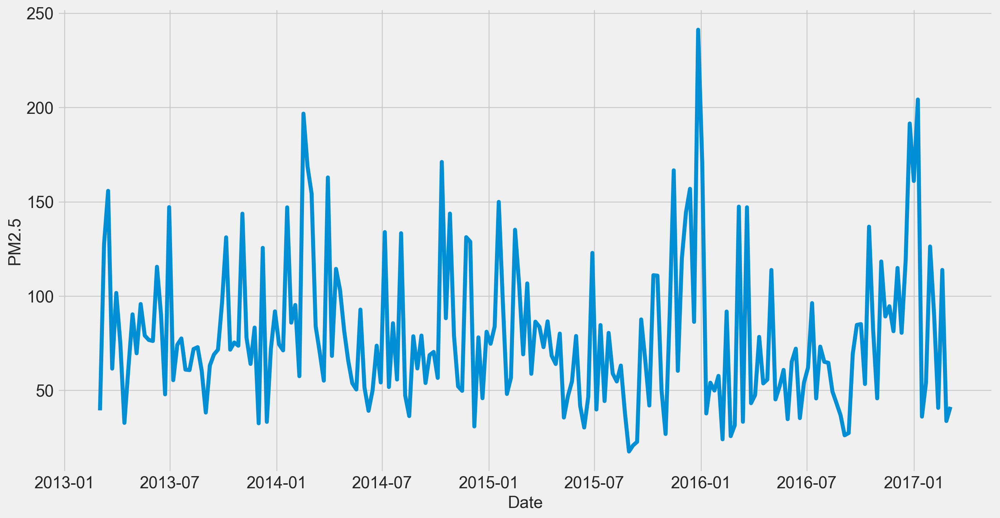

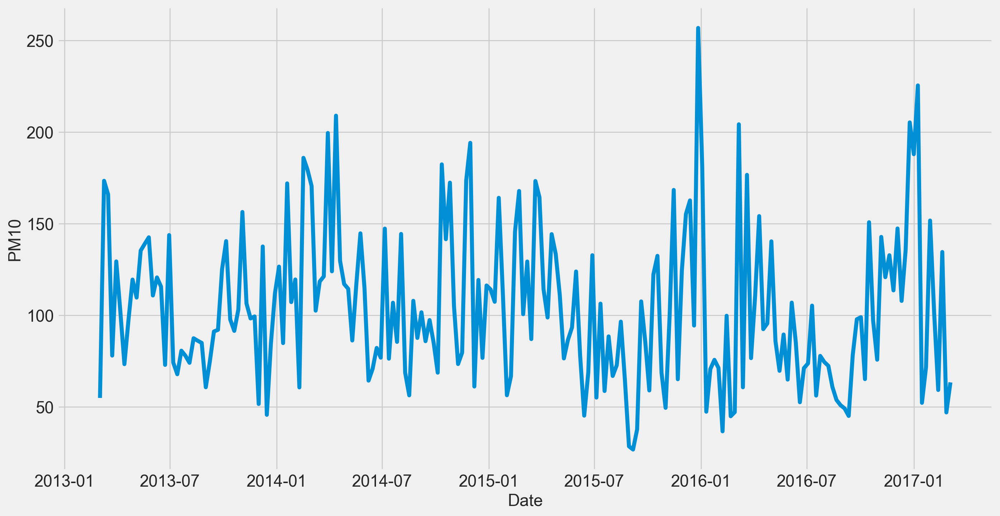

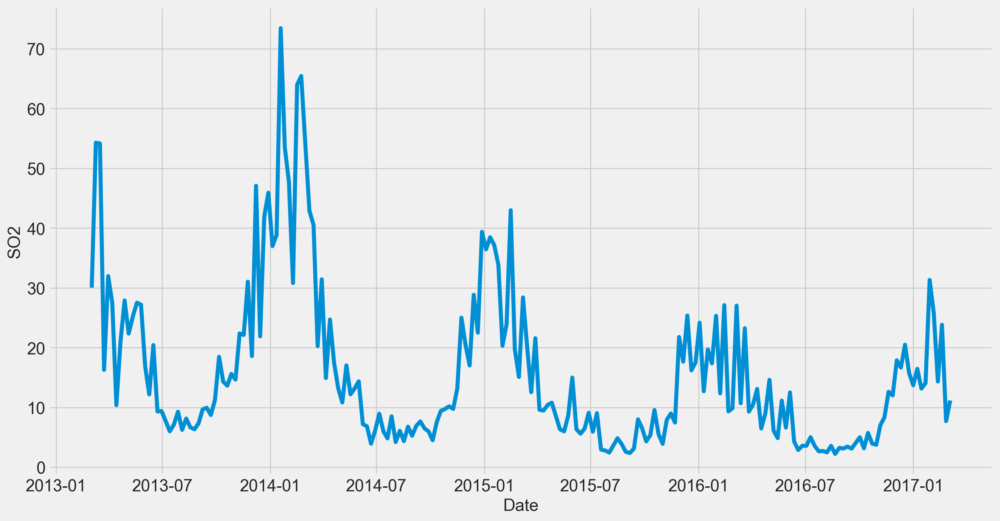

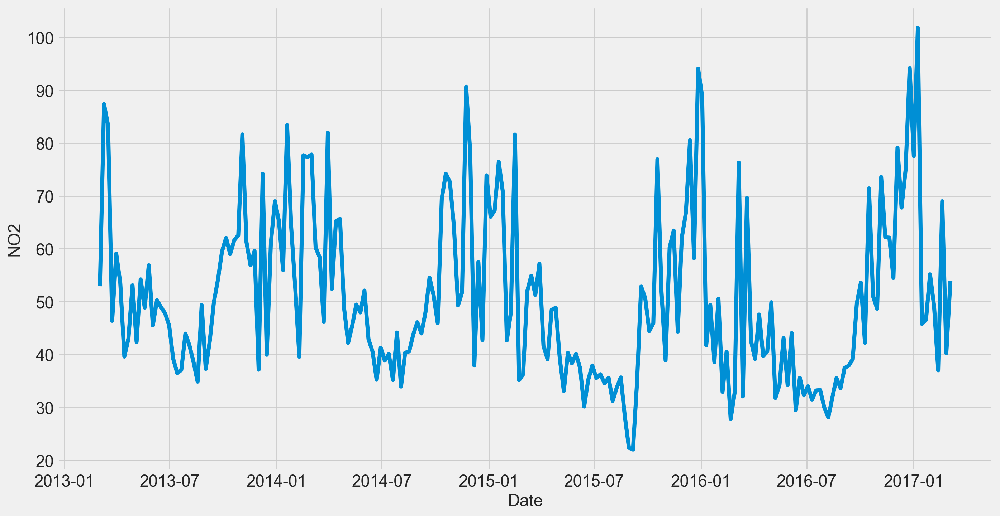

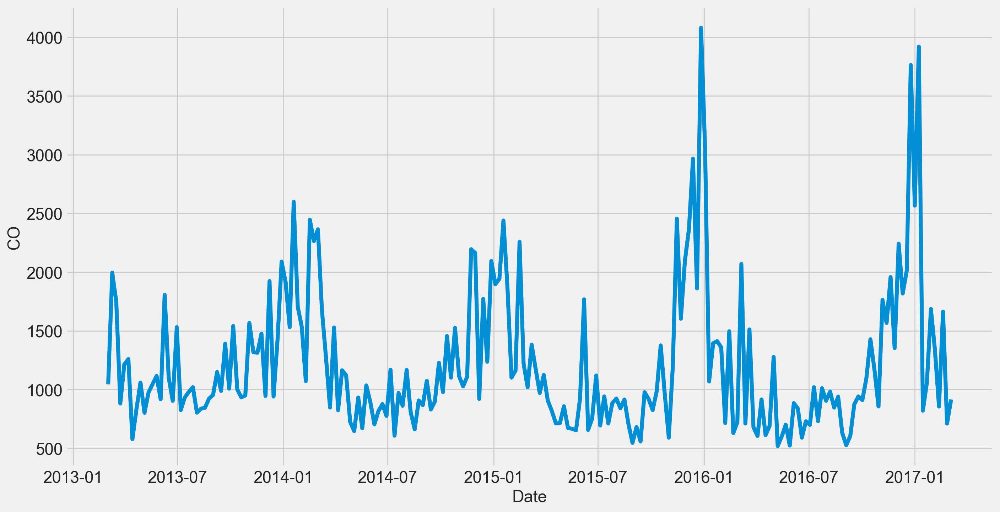

...

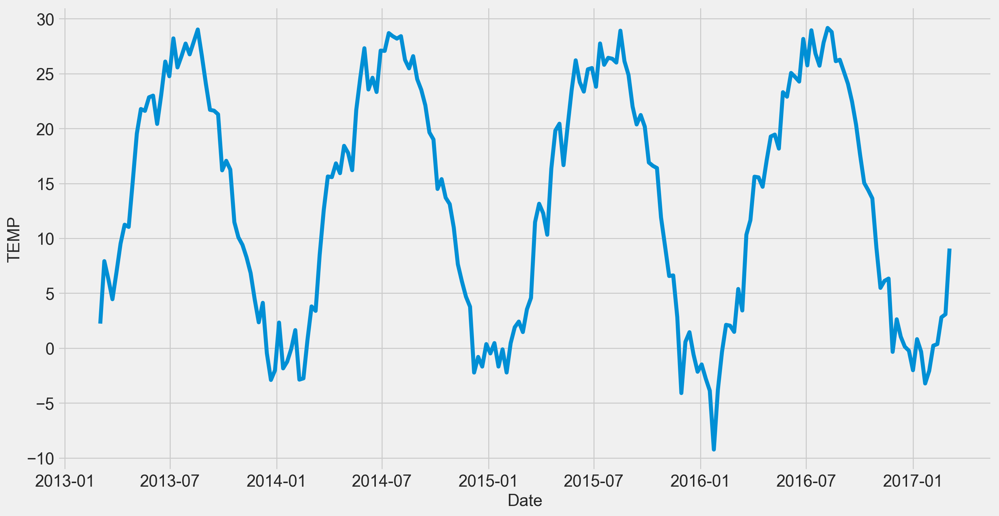

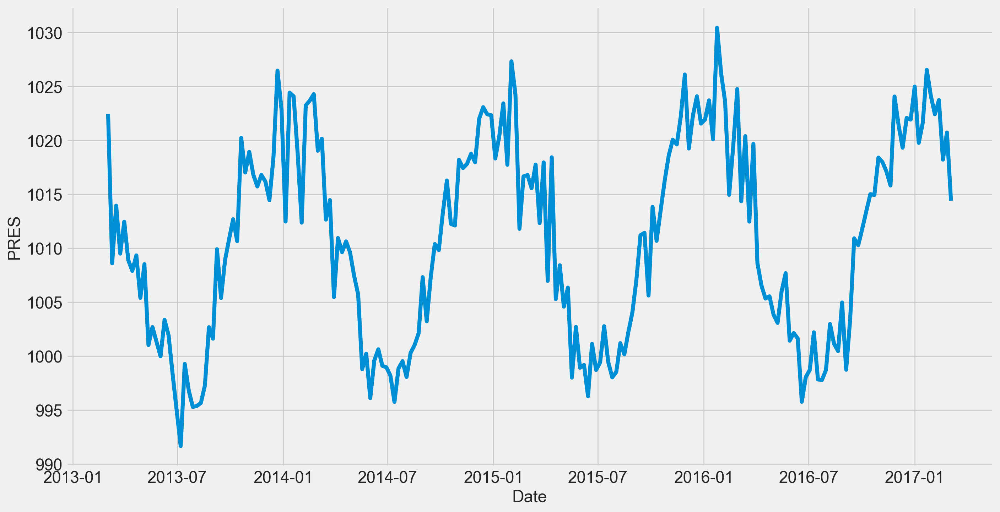

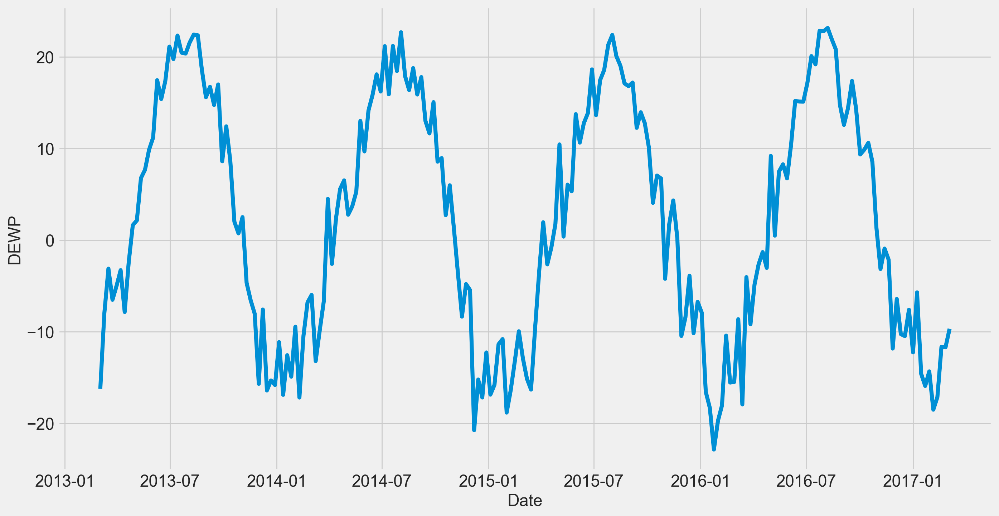

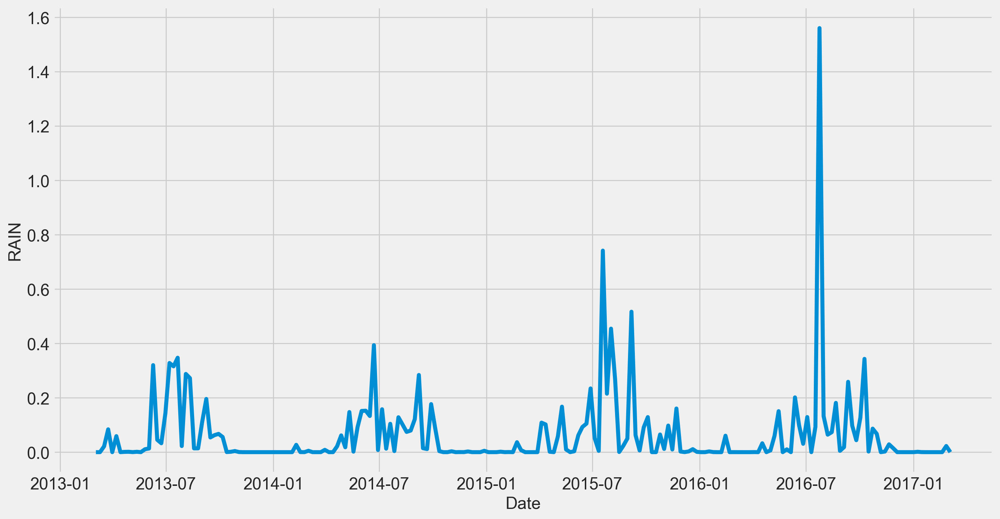

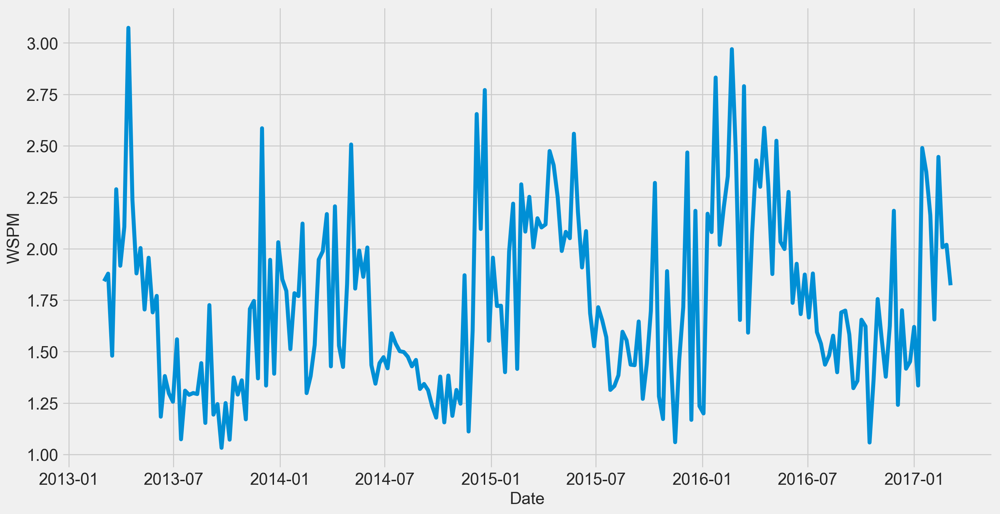

In [36]:
def plot_data(col):
    plt.figure(figsize=(15,8))
    sns.lineplot(y=col ,x='Date',data=df_weekly)
    
    
for col in df_weekly.columns:
    plot_data(col)

In [37]:
df_monthly = df_daily.resample('M').mean()
df_monthly.head()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
Date,,,,,,,,,,,
2013-03-31,104.625672,128.717686,38.285982,67.494017,1420.110215,56.387590,5.992249,1012.224373,-6.682090,0.023768,1.886414
2013-04-30,62.086227,95.828819,20.614506,46.457355,902.883218,61.348644,12.380058,1007.811817,-3.203681,0.014294,2.333310
2013-05-31,80.890009,129.808356,24.939006,50.576037,983.023746,83.671420,21.676691,1002.652912,8.131384,0.005791,1.811694
2013-06-30,101.236053,115.835012,13.625159,48.249550,1332.907755,74.453136,23.583426,999.639838,17.433322,0.126528,1.287350
2013-07-31,67.378678,76.557345,7.410949,39.955142,932.193486,78.636699,27.108838,995.501639,20.902231,0.275582,1.317039


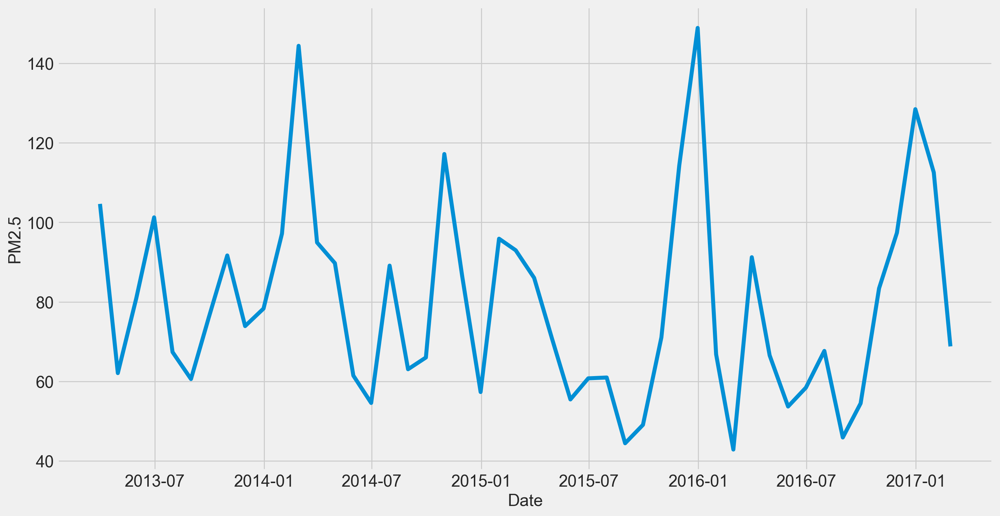

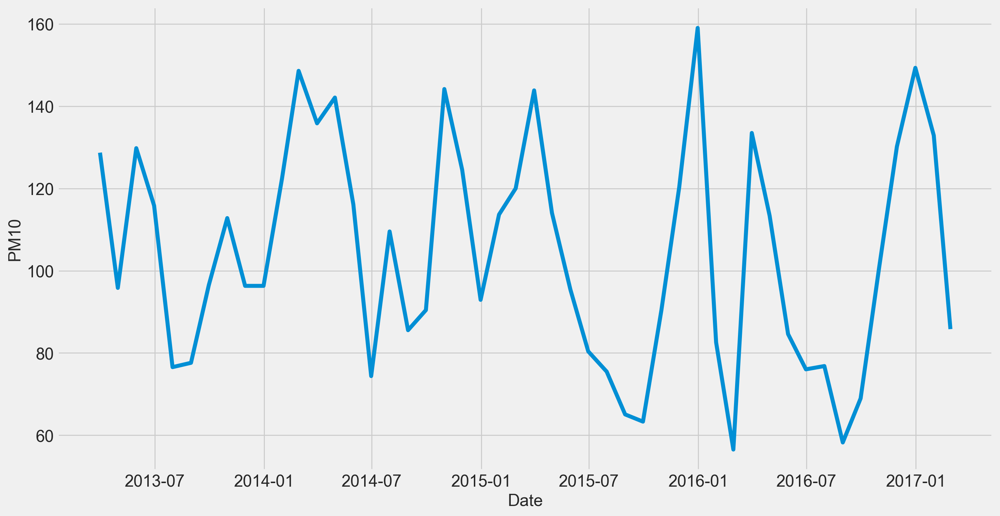

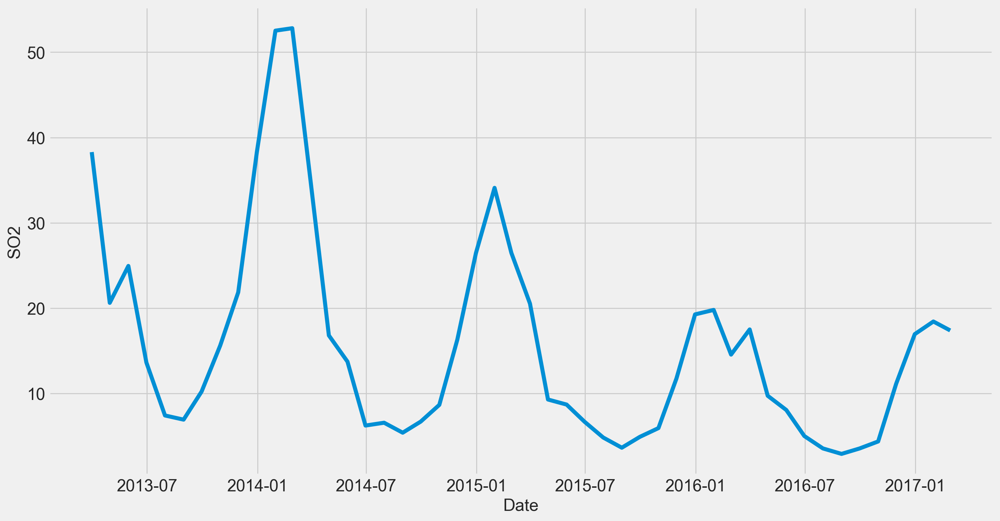

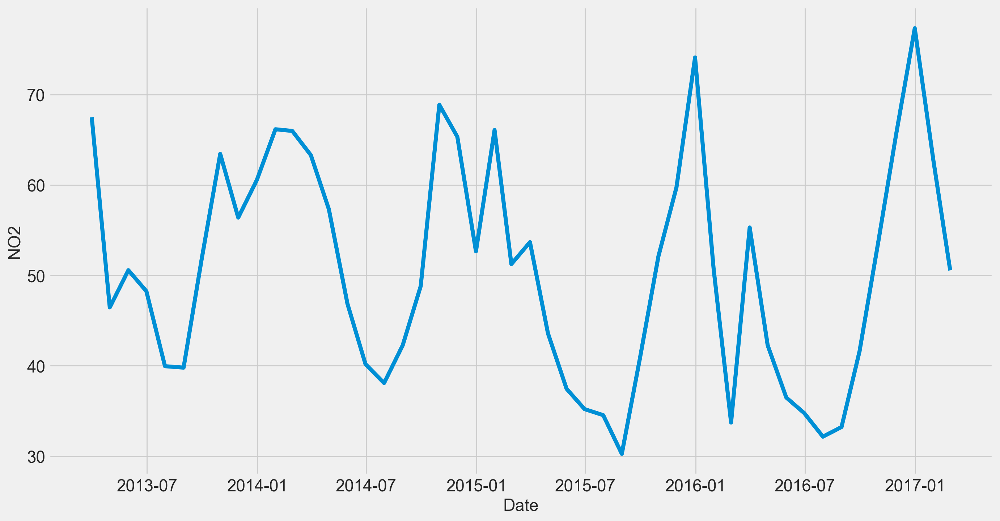

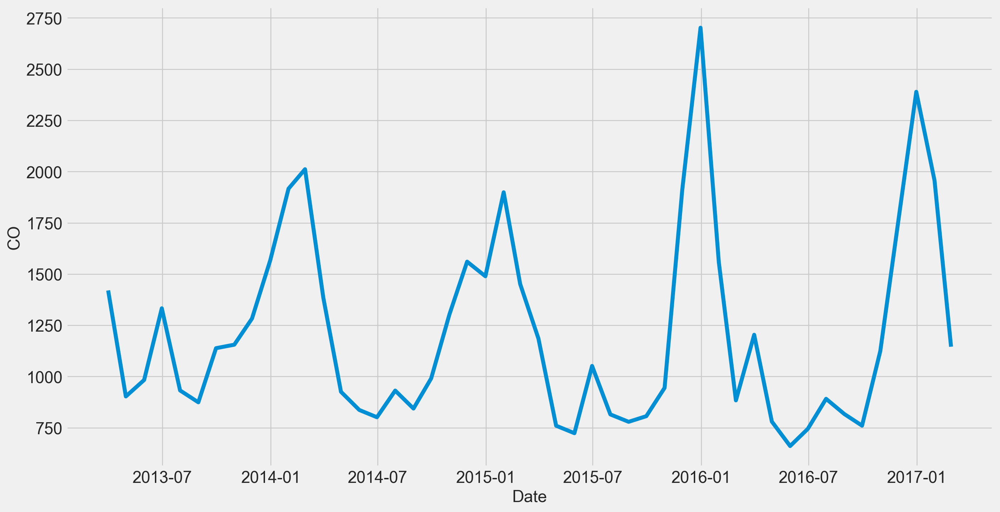

...

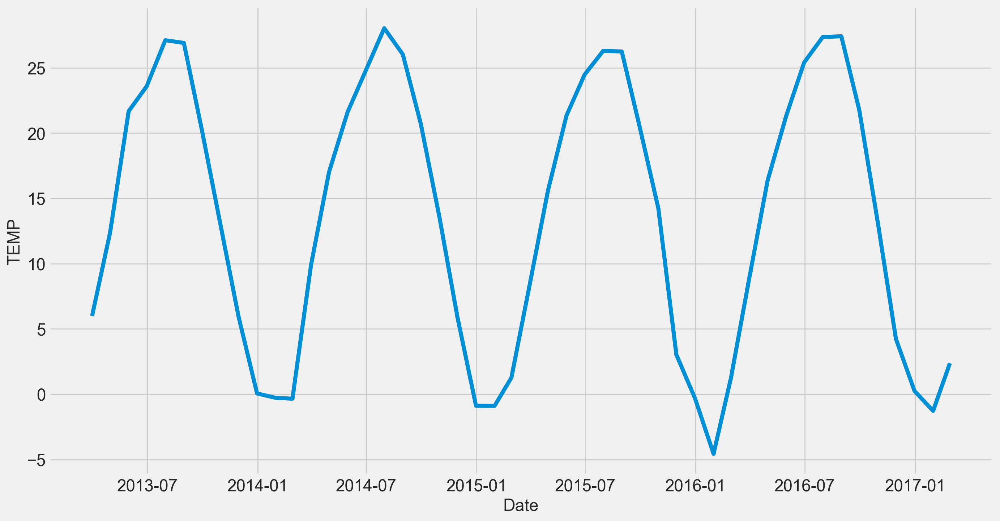

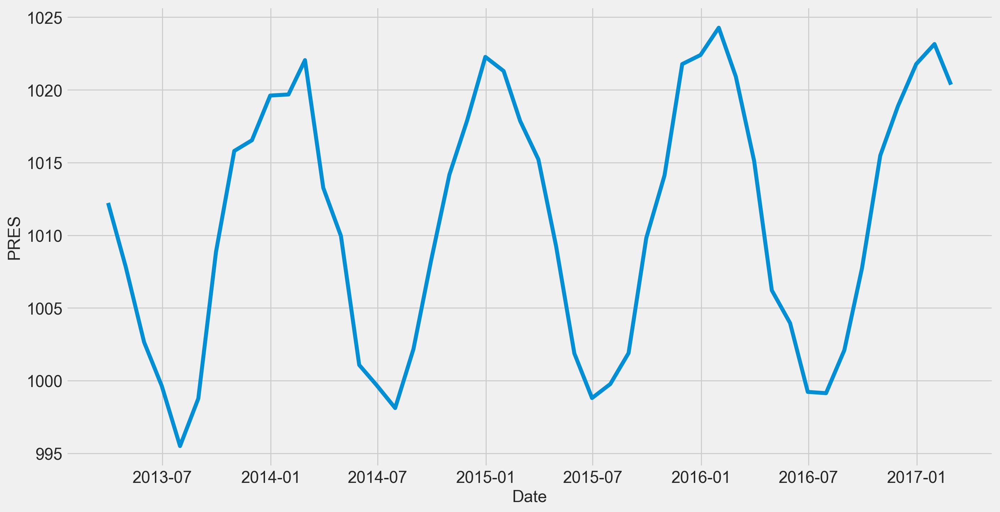

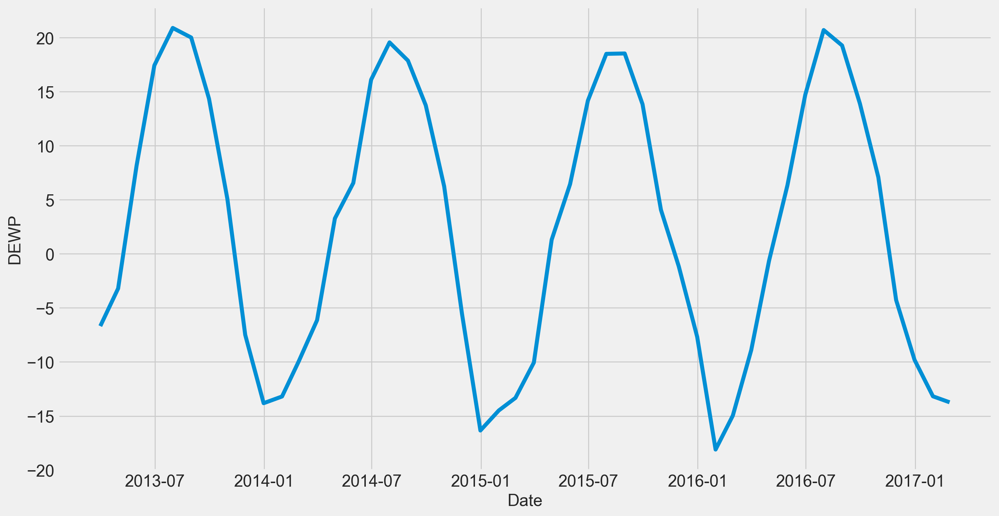

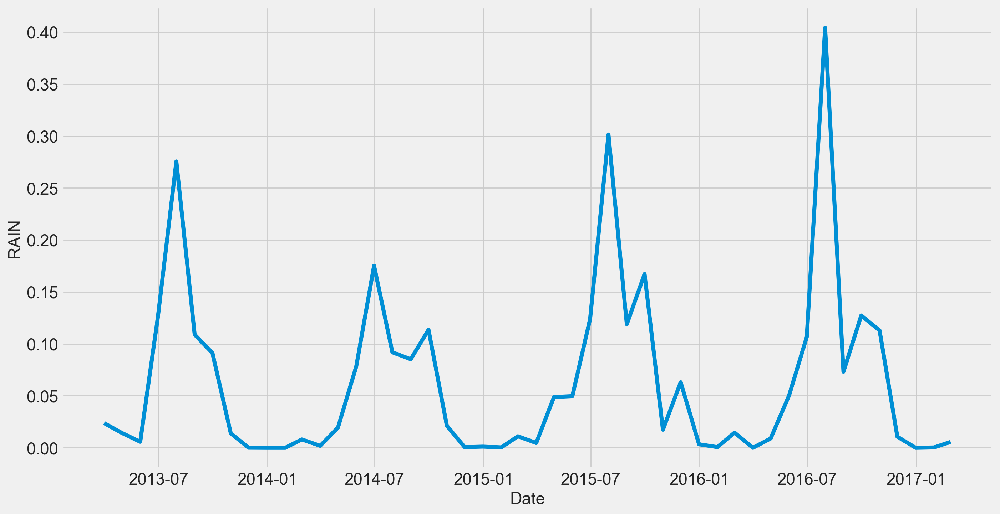

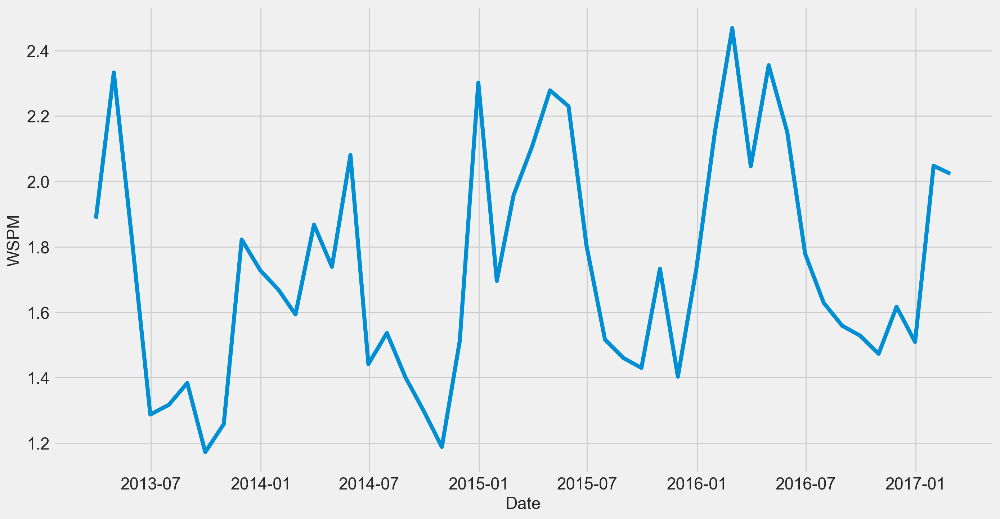

In [38]:
def plot_data(col):
    plt.figure(figsize=(15,8))
    sns.lineplot(y=col ,x='Date',data=df_monthly)
    
    
for col in df_monthly.columns:
    plot_data(col)

<Axes: >

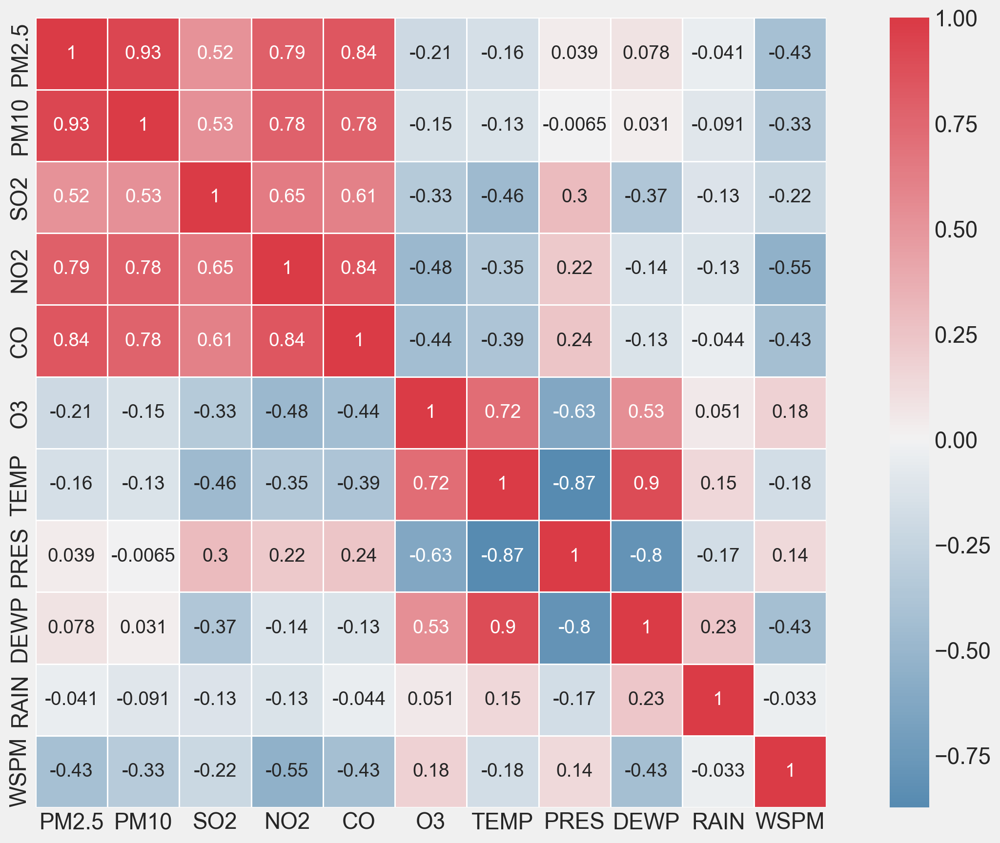

In [39]:
pollutant_corr = df_daily.corr()  # Pearson correlation
f, ax = plt.subplots(figsize=(15, 10))
cmap = sns.diverging_palette(240, 10, n=9, as_cmap=True)
sns.heatmap(pollutant_corr, cmap=cmap, annot=True, vmax=1, center=0,
            square=True, linewidth=.5)

In [40]:
df_daily.corr()['PM2.5'].sort_values(ascending = False)

PM2.5    1.000000
PM10     0.929920
CO       0.844116
NO2      0.790620
SO2      0.520958
DEWP     0.077827
PRES     0.038845
RAIN    -0.041176
TEMP    -0.158985
O3      -0.206512
WSPM    -0.427097
Name: PM2.5, dtype: float64

In [41]:
df3 = pd.read_csv('clean_data.csv')

In [77]:
df3

,Date,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,dateInt,date
0,2013-03-01 00:00:00,2013,3,1,0,6.0,18.0,5.0,50.638586,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng,20130301,2013-03-01
1,2013-03-01 01:00:00,2013,3,1,1,6.0,15.0,5.0,50.638586,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng,20130301,2013-03-01
2,2013-03-01 02:00:00,2013,3,1,2,5.0,18.0,7.0,50.638586,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng,20130301,2013-03-01
3,2013-03-01 03:00:00,2013,3,1,3,6.0,20.0,6.0,50.638586,900.0,45.0,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng,20130301,2013-03-01
4,2013-03-01 04:00:00,2013,3,1,4,5.0,17.0,5.0,50.638586,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng,20130301,2013-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
418941,2017-02-28 19:00:00,2017,2,28,19,27.0,72.0,8.0,92.000000,800.0,16.0,10.3,1014.2,-12.4,0.0,W,1.8,Shunyi,20170228,2017-02-28
418942,2017-02-28 20:00:00,2017,2,28,20,47.0,55.0,17.0,86.000000,1100.0,19.0,9.8,1014.5,-9.9,0.0,NW,1.5,Shunyi,20170228,2017-02-28
418943,2017-02-28 21:00:00,2017,2,28,21,18.0,28.0,4.0,30.000000,500.0,64.0,9.1,1014.6,-12.7,0.0,NE,1.7,Shunyi,20170228,2017-02-28
418944,2017-02-28 22:00:00,2017,2,28,22,18.0,20.0,9.0,33.000000,500.0,59.0,7.1,1015.2,-13.2,0.0,WNW,1.8,Shunyi,20170228,2017-02-28


In [42]:
pm25_top5 = df3.groupby(by='station').agg({'PM2.5': 'mean'}).sort_values(by='PM2.5', ascending=False).head(5).reset_index()
pm25_top5_st_codes = pm25_top5['station'].tolist()
print('PM2.5 Top 5 station codes: {}'.format(pm25_top5_st_codes))
pm25_top5

PM2.5 Top 5 station codes: ['Dongsi', 'Wanshouxigong', 'Nongzhanguan', 'Gucheng', 'Wanliu']


,station,PM2.5
0,Dongsi,85.483425
1,Wanshouxigong,84.393097
2,Nongzhanguan,84.271680
3,Gucheng,83.225905
4,Wanliu,83.055977


In [43]:
pm10_top5 = df3.groupby(by='station').agg({'PM10': 'mean'}).sort_values(by='PM10', ascending=False).head(5).reset_index()
pm10_top5_st_codes = pm10_top5['station'].tolist()
print('PM10 Top 5 station codes: {}'.format(pm10_top5_st_codes))
pm10_top5

PM10 Top 5 station codes: ['Gucheng', 'Wanshouxigong', 'Wanliu', 'Dongsi', 'Aotizhongxin']


,station,PM10
0,Gucheng,118.398825
1,Wanshouxigong,111.796461
2,Wanliu,110.236467
3,Dongsi,109.834056
4,Aotizhongxin,109.476180
